# Artificial Intelligence Nanodegree

## Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

---

In this notebook, some template code has already been provided for you, and you will need to implement additional functionality to successfully complete this project. You will not need to modify the included code beyond what is requested. Sections that begin with **'(IMPLEMENTATION)'** in the header indicate that the following block of code will require additional functionality which you must provide. Instructions will be provided for each section, and the specifics of the implementation are marked in the code block with a 'TODO' statement. Please be sure to read the instructions carefully! 

> **Note**: Once you have completed all of the code implementations, you need to finalize your work by exporting the iPython Notebook as an HTML document. Before exporting the notebook to html, all of the code cells need to have been run so that reviewers can see the final implementation and output. You can then export the notebook by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question X'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut.  Markdown cells can be edited by double-clicking the cell to enter edit mode.

The rubric contains _optional_ "Stand Out Suggestions" for enhancing the project beyond the minimum requirements. If you decide to pursue the "Stand Out Suggestions", you should include the code in this IPython notebook.



---
### Why We're Here 

In this notebook, you will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of your finished project (... but we expect that each student's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, you will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  Your imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

We break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Use a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 6](#step6): Write your Algorithm
* [Step 7](#step7): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

### Import Dog Dataset

In the code cell below, we import a dataset of dog images.  We populate a few variables through the use of the `load_files` function from the scikit-learn library:
- `train_files`, `valid_files`, `test_files` - numpy arrays containing file paths to images
- `train_targets`, `valid_targets`, `test_targets` - numpy arrays containing onehot-encoded classification labels 
- `dog_names` - list of string-valued dog breed names for translating labels

In [1]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('dogImages/train')
valid_files, valid_targets = load_dataset('dogImages/valid')
test_files, test_targets = load_dataset('dogImages/test')

# load list of dog names
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]

# print statistics about the dataset
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

Using TensorFlow backend.


There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


### Import Human Dataset

In the code cell below, we import a dataset of human images, where the file paths are stored in the numpy array `human_files`.

In [2]:
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


---
<a id='step1'></a>
## Step 1: Detect Humans

We use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  We have downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, we demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


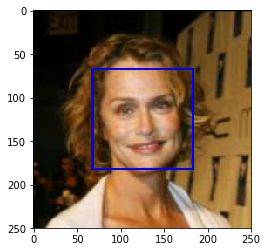

In [3]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[3])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [4]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 
98% of human faces are detected as human.
11% of dog faces are detected as human.

In [5]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
detected_human_faces_as_human = sum([face_detector(human_file) for human_file in human_files_short])
detected_dog_faces_as_human = sum([face_detector(dog_file) for dog_file in dog_files_short])

print("human",detected_human_faces_as_human)
print("dog",detected_dog_faces_as_human)



human 98
dog 11


__Question 2:__ This algorithmic choice necessitates that we communicate to the user that we accept human images only when they provide a clear view of a face (otherwise, we risk having unneccessarily frustrated users!). In your opinion, is this a reasonable expectation to pose on the user? If not, can you think of a way to detect humans in images that does not necessitate an image with a clearly presented face?

__Answer:__ I think it's a reasonable expectation because user can take picture of him/herself with camera if necessary. Another option would be use another detection algorithm or a CNN. 

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on each of the datasets.

__Alternative face detector__

I decided to try another face detection library. After some googling, I found a facenet library by David Sandberg in github https://github.com/davidsandberg/facenet. This is a TensorFlow implementation of the face recognizer described in the paper "FaceNet: A Unified Embedding for Face Recognition and Clustering" https://arxiv.org/abs/1503.03832. There are some pretrained CNNs which can be used. This is great because I don't have to train it myself! There are no usage examples in the library but I found an article by Charles Jekel http://jekel.me/2017/How-to-detect-faces-using-facenet/ with installation and usage instructions. 

Installation was little bit complicated because conda and pip installation didn't work for this project. I had to clone it, add it's src directory to PYTHONPATH and install needed dependencies. Usage was very simple. 

The results were very good. It recognized all of the 100 human faces. The opencv implementation was better with false positives. Opencv detected only 11 dog faces as human, but facenet detected 17 (2 of these were actual human faces with dogs). 

__Note!__: To run the cell below you need to follow instructions in the article above to install the correct libraries. 

Creating networks and loading parameters
human face detected for dog dogImages/train/057.Dalmatian/Dalmatian_04054.jpg
Accuracy score 0.838373720646


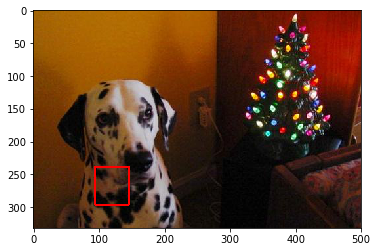

human face detected for dog dogImages/train/088.Irish_water_spaniel/Irish_water_spaniel_06014.jpg
Accuracy score 0.844253122807


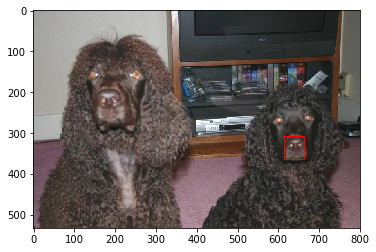

human face detected for dog dogImages/train/106.Newfoundland/Newfoundland_06989.jpg
Accuracy score 0.999930620193


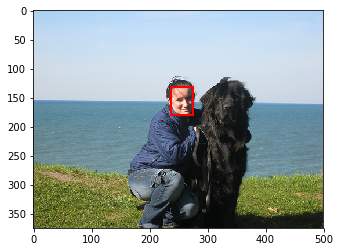

human face detected for dog dogImages/train/117.Pekingese/Pekingese_07559.jpg
Accuracy score 0.821794092655


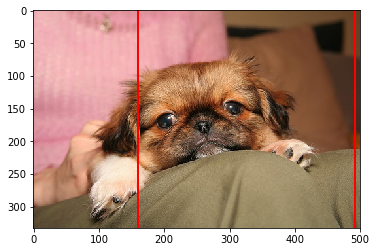

human face detected for dog dogImages/train/067.Finnish_spitz/Finnish_spitz_04672.jpg
Accuracy score 0.721548199654


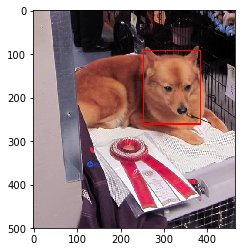

human face detected for dog dogImages/train/005.Alaskan_malamute/Alaskan_malamute_00370.jpg
Accuracy score 0.998140692711


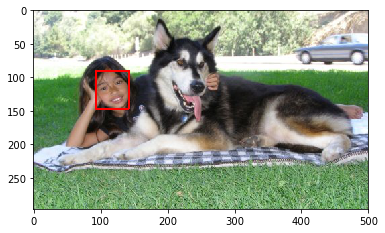

human face detected for dog dogImages/train/012.Australian_shepherd/Australian_shepherd_00855.jpg
Accuracy score 0.810269773006


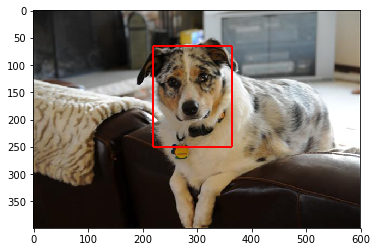

human face detected for dog dogImages/train/047.Chesapeake_bay_retriever/Chesapeake_bay_retriever_03365.jpg
Accuracy score 0.753928720951


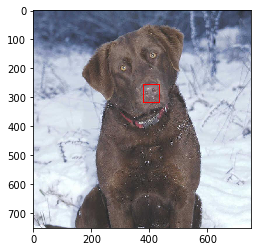

human face detected for dog dogImages/train/027.Bloodhound/Bloodhound_01946.jpg
Accuracy score 0.864946722984


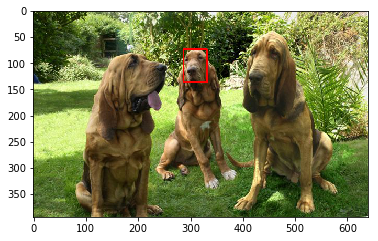

human face detected for dog dogImages/train/082.Havanese/Havanese_05616.jpg
Accuracy score 0.902984321117


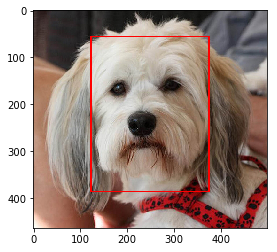

human face detected for dog dogImages/train/085.Irish_red_and_white_setter/Irish_red_and_white_setter_05779.jpg
Accuracy score 0.844080686569


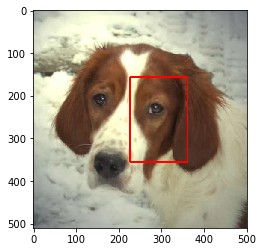

human face detected for dog dogImages/train/120.Pharaoh_hound/Pharaoh_hound_07726.jpg
Accuracy score 0.789696037769


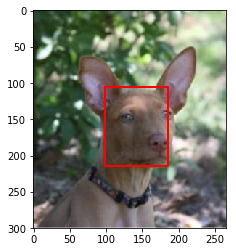

human face detected for dog dogImages/train/046.Cavalier_king_charles_spaniel/Cavalier_king_charles_spaniel_03305.jpg
Accuracy score 0.852102577686


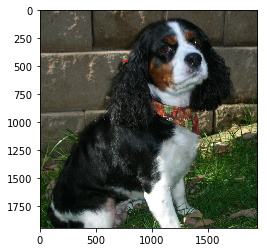

human face detected for dog dogImages/train/084.Icelandic_sheepdog/Icelandic_sheepdog_05705.jpg
Accuracy score 0.836103737354


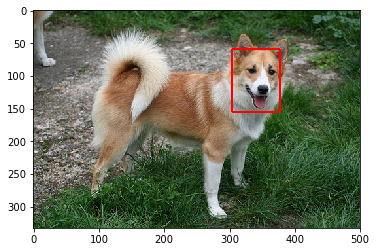

human face detected for dog dogImages/train/106.Newfoundland/Newfoundland_07004.jpg
Accuracy score 0.867503166199


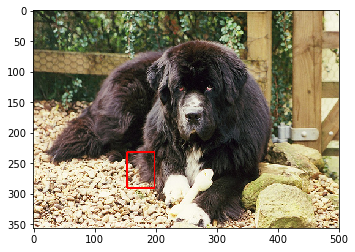

human face detected for dog dogImages/train/087.Irish_terrier/Irish_terrier_05942.jpg
Accuracy score 0.905200183392


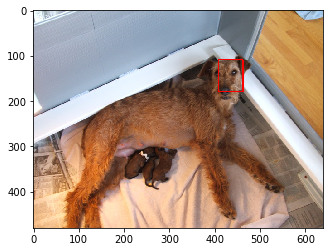

human face detected for dog dogImages/train/067.Finnish_spitz/Finnish_spitz_04673.jpg
Accuracy score 0.977993607521


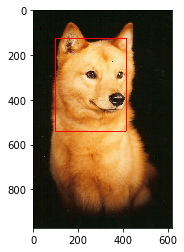

Detected 100 faces from total 100 human faces.
Detected 17 faces from total 100 dog faces.


In [6]:
## (Optional) TODO: Report the performance of another  
## face detection algorithm on the LFW dataset
### Feel free to use as many code cells as needed.

#   import facenet libraries
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from scipy import misc
import tensorflow as tf
import os
import align.detect_face

#  import other libraries
import cv2
import matplotlib.pyplot as plt

#   setup facenet parameters
gpu_memory_fraction = 1.0
minsize = 50 # minimum size of face
threshold = [ 0.6, 0.7, 0.7 ]  # three steps's threshold
factor = 0.709 # scale factor

# Start code from facenet/src/compare.py
print('Creating networks and loading parameters')
with tf.Graph().as_default():
    gpu_options = tf.GPUOptions(
        per_process_gpu_memory_fraction=gpu_memory_fraction)
    sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options,
        log_device_placement=False))
    with sess.as_default():
        pnet, rnet, onet = align.detect_face.create_mtcnn(
            sess, None)
# end code from facenet/src/compare.py

    num_human_detected = 0
    for file in human_files_short:
        img = misc.imread(file)
        # run detect_face from the facenet library
        bounding_boxes, _ = align.detect_face.detect_face(
                img, minsize, pnet,
                rnet, onet, threshold, factor)

        if len(bounding_boxes) > 0:
            num_human_detected += 1
        else:
            print("face not detected for",file)
            plt.figure()
            plt.imshow(img)
            plt.show()            
            
    # Detect human faces from dog images
    num_dog_detected = 0
    for file in dog_files_short:
        img = misc.imread(file)

        # run detect_face from the facenet library
        bounding_boxes, _ = align.detect_face.detect_face(
                img, minsize, pnet,
                rnet, onet, threshold, factor)

        if len(bounding_boxes) > 0:
            num_dog_detected += 1
            print("human face detected for dog",file)
            for (x1, y1, x2, y2, acc) in bounding_boxes:
                w = x2-x1
                h = y2-y1
                # plot the box using cv2
                cv2.rectangle(img,(int(x1),int(y1)),(int(x1+w), int(y1+h)),(255,0,0),2)
                print('Accuracy score', acc)

            plt.figure()
            plt.imshow(img)
            plt.show()            
        
    print('Detected %i faces from total %i human faces.' % (num_human_detected,len(human_files_short)))
    print('Detected %i faces from total %i dog faces.' % (num_dog_detected,len(dog_files_short)))

    
    

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, we use a pre-trained [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) model to detect dogs in images.  Our first line of code downloads the ResNet-50 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  Given an image, this pre-trained ResNet-50 model returns a prediction (derived from the available categories in ImageNet) for the object that is contained in the image.

In [7]:
from keras.applications.resnet50 import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights='imagenet')

### Pre-process the Data

When using TensorFlow as backend, Keras CNNs require a 4D array (which we'll also refer to as a 4D tensor) as input, with shape

$$
(\text{nb_samples}, \text{rows}, \text{columns}, \text{channels}),
$$

where `nb_samples` corresponds to the total number of images (or samples), and `rows`, `columns`, and `channels` correspond to the number of rows, columns, and channels for each image, respectively.  

The `path_to_tensor` function below takes a string-valued file path to a color image as input and returns a 4D tensor suitable for supplying to a Keras CNN.  The function first loads the image and resizes it to a square image that is $224 \times 224$ pixels.  Next, the image is converted to an array, which is then resized to a 4D tensor.  In this case, since we are working with color images, each image has three channels.  Likewise, since we are processing a single image (or sample), the returned tensor will always have shape

$$
(1, 224, 224, 3).
$$

The `paths_to_tensor` function takes a numpy array of string-valued image paths as input and returns a 4D tensor with shape 

$$
(\text{nb_samples}, 224, 224, 3).
$$

Here, `nb_samples` is the number of samples, or number of images, in the supplied array of image paths.  It is best to think of `nb_samples` as the number of 3D tensors (where each 3D tensor corresponds to a different image) in your dataset!

In [8]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

### Making Predictions with ResNet-50

Getting the 4D tensor ready for ResNet-50, and for any other pre-trained model in Keras, requires some additional processing.  First, the RGB image is converted to BGR by reordering the channels.  All pre-trained models have the additional normalization step that the mean pixel (expressed in RGB as $[103.939, 116.779, 123.68]$ and calculated from all pixels in all images in ImageNet) must be subtracted from every pixel in each image.  This is implemented in the imported function `preprocess_input`.  If you're curious, you can check the code for `preprocess_input` [here](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py).

Now that we have a way to format our image for supplying to ResNet-50, we are now ready to use the model to extract the predictions.  This is accomplished with the `predict` method, which returns an array whose $i$-th entry is the model's predicted probability that the image belongs to the $i$-th ImageNet category.  This is implemented in the `ResNet50_predict_labels` function below.

By taking the argmax of the predicted probability vector, we obtain an integer corresponding to the model's predicted object class, which we can identify with an object category through the use of this [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [9]:
from keras.applications.resnet50 import preprocess_input, decode_predictions

def ResNet50_predict_labels(img_path):
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

### Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained ResNet-50 model, we need only check if the `ResNet50_predict_labels` function above returns a value between 151 and 268 (inclusive).

We use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [10]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return ((prediction <= 268) & (prediction >= 151)) 

### (IMPLEMENTATION) Assess the Dog Detector

__Question 3:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 1% of human_files_short had a detected dog. 100% of dog_files_short had a detected dog.

In [11]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
print("Humans detected as dogs",sum([dog_detector(file) for file in human_files_short]))

Humans detected as dogs 1


In [12]:
print("Dogs detected as dogs",sum([dog_detector(file) for file in dog_files_short]))

Dogs detected as dogs 100


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that we have functions for detecting humans and dogs in images, we need a way to predict breed from images.  In this step, you will create a CNN that classifies dog breeds.  You must create your CNN _from scratch_ (so, you can't use transfer learning _yet_!), and you must attain a test accuracy of at least 1%.  In Step 5 of this notebook, you will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

Be careful with adding too many trainable layers!  More parameters means longer training, which means you are more likely to need a GPU to accelerate the training process.  Thankfully, Keras provides a handy estimate of the time that each epoch is likely to take; you can extrapolate this estimate to figure out how long it will take for your algorithm to train. 

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  

Remember that the practice is far ahead of the theory in deep learning.  Experiment with many different architectures, and trust your intuition.  And, of course, have fun! 

### Pre-process the Data

We rescale the images by dividing every pixel in every image by 255.

In [13]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|██████████| 836/836 [00:16<00:00, 68.43it/s]


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        model.summary()

We have imported some Python modules to get you started, but feel free to import as many modules as you need.  If you end up getting stuck, here's a hint that specifies a model that trains relatively fast on CPU and attains >1% test accuracy in 5 epochs:

![Sample CNN](images/sample_cnn.png)
           
__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  If you chose to use the hinted architecture above, describe why you think that CNN architecture should work well for the image classification task.

__Answer:__ The architechture works, because the convolution layers detect more detailed features from the image sequentially. For example, first layer might detect colors, second layer simple shapes and third layer more detailed features, like eyes or ears. The layers build on each other's detections. 

In [14]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()

### TODO: Define your architecture.
model.add(Conv2D(filters=16, kernel_size=2, padding='valid', activation='relu', 
                        input_shape=(224, 224, 3),name="conv_1"))
model.add(MaxPooling2D(pool_size=2, name="pool_1"))
model.add(Conv2D(filters=32, kernel_size=2, padding='valid', activation='relu', name="conv_2"))
model.add(MaxPooling2D(pool_size=2, name="pool_2"))
model.add(Conv2D(filters=64, kernel_size=2, padding='valid', activation='relu', name="conv_3"))
model.add(MaxPooling2D(pool_size=2, name="pool_3"))
model.add(GlobalAveragePooling2D(name="gap_1"))
model.add(Dense(133, activation='softmax', name="dense_1"))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 223, 223, 16)      208       
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 111, 111, 16)      0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 110, 110, 32)      2080      
_________________________________________________________________
pool_2 (MaxPooling2D)        (None, 55, 55, 32)        0         
_________________________________________________________________
conv_3 (Conv2D)              (None, 54, 54, 64)        8256      
_________________________________________________________________
pool_3 (MaxPooling2D)        (None, 27, 27, 64)        0         
_________________________________________________________________
gap_1 (GlobalAveragePooling2 (None, 64)                0         
__________

### Compile the Model

In [15]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [16]:
from keras.callbacks import ModelCheckpoint  

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 3

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', 
                               verbose=1, save_best_only=True)

model.fit(train_tensors, train_targets, 
          validation_data=(valid_tensors, valid_targets),
          epochs=epochs, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/3
6680/6680 [==============================] - 342s - loss: 4.8852 - acc: 0.0090 - val_loss: 4.8683 - val_acc: 0.0096
Epoch 2/3
6680/6680 [==============================] - 270s - loss: 4.8575 - acc: 0.0126 - val_loss: 4.8443 - val_acc: 0.0168
Epoch 3/3
6680/6680 [==============================] - 276s - loss: 4.8193 - acc: 0.0172 - val_loss: 4.8222 - val_acc: 0.0168


### Load the Model with the Best Validation Loss

In [17]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

### Test the Model

Try out your model on the test dataset of dog images.  Ensure that your test accuracy is greater than 1%.

In [18]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 2.1531%


I will visualize this model to better understand how it works using instructions in https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html

Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv_1 (Conv2D)              (None, 223, 223, 16)      208       
_________________________________________________________________
pool_1 (MaxPooling2D)        (None, 111, 111, 16)      0         
_________________________________________________________________
conv_2 (Conv2D)              (None, 110, 110, 32)      2080      
_________________________________________________________________
pool_2 (MaxPooling2D)        (None, 55, 55, 32)        0         
_________________________________________________________________
conv_3 (Conv2D)              (None, 54, 54, 64)        8256      
_________________________________________________________________
pool_3 (MaxPooling2D)        (None, 27, 27, 64)        0         
_________________________________________________________________
gap_1 (GlobalAveragePooling2 (None, 64)                0      

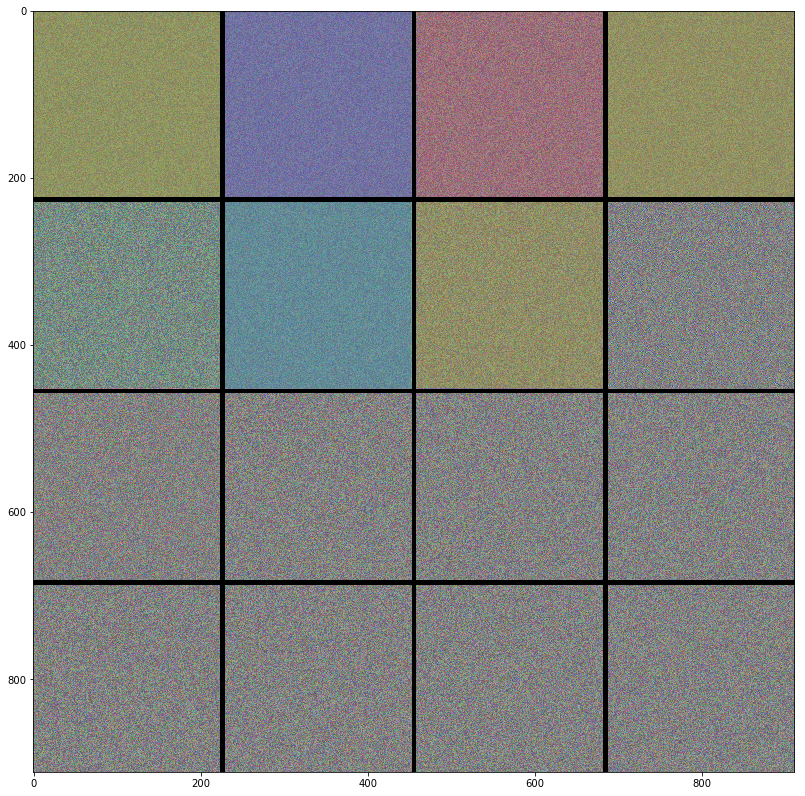

processing layer conv_2
Filter 0 processed in 1s
Filter 4 processed in 1s
Filter 8 processed in 0s
Filter 12 processed in 0s
Filter 16 processed in 0s
Filter 20 processed in 0s
Filter 24 processed in 0s
Filter 28 processed in 2s


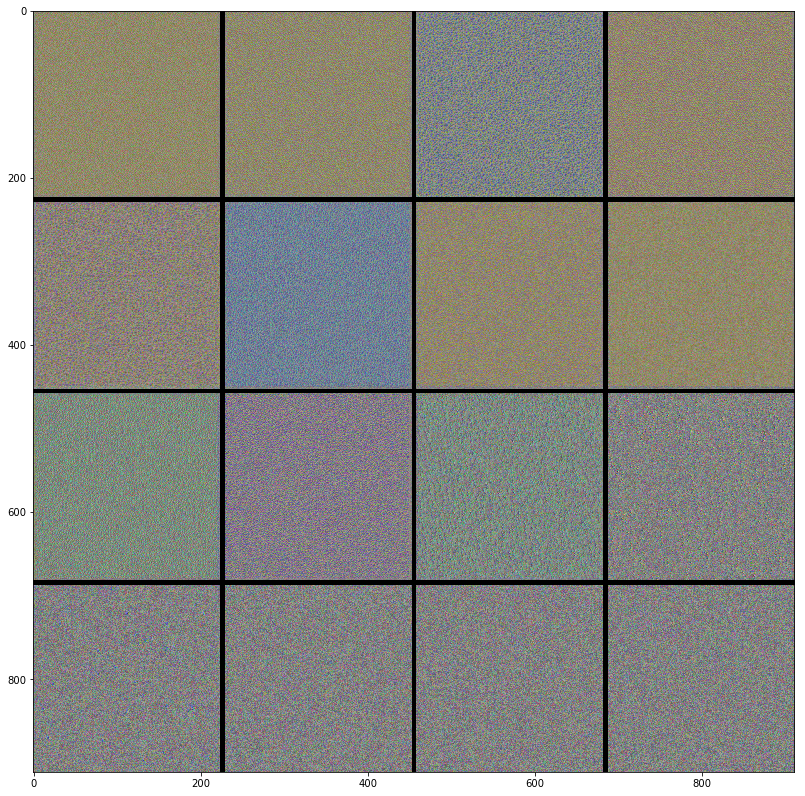

processing layer conv_3
Filter 0 processed in 0s
Filter 4 processed in 0s
Filter 8 processed in 0s
Filter 12 processed in 0s
Filter 16 processed in 1s
Filter 20 processed in 1s
Filter 24 processed in 0s
Filter 28 processed in 1s
Filter 32 processed in 1s
Filter 36 processed in 0s
Filter 40 processed in 0s
Filter 44 processed in 1s
Filter 48 processed in 1s
Filter 52 processed in 1s
Filter 56 processed in 1s
Filter 60 processed in 1s


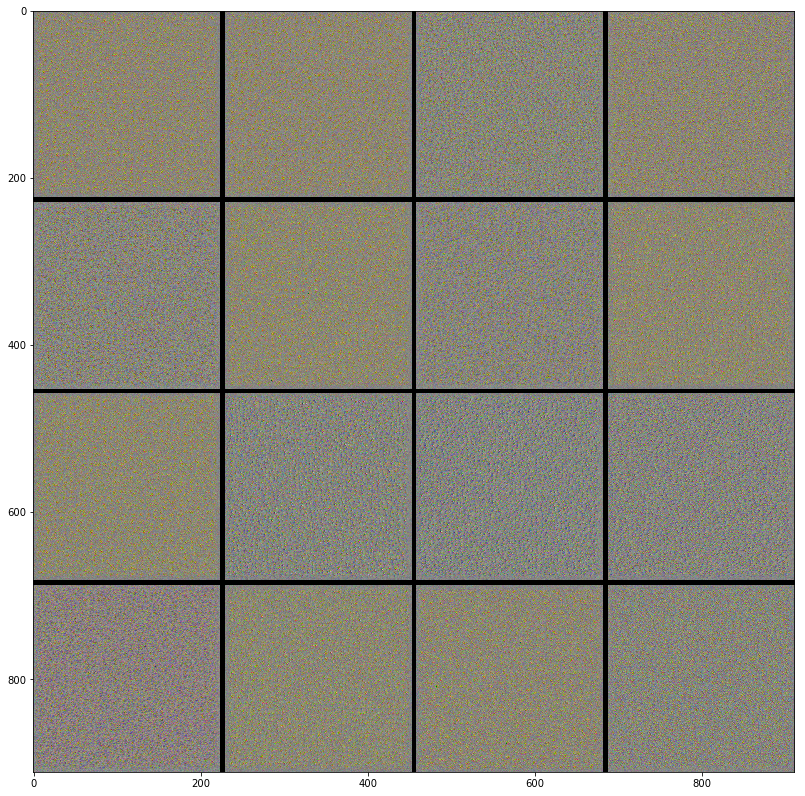

In [19]:
from scipy.misc import imsave
import numpy as np
import time
from keras.applications import vgg16
from keras import backend as K

# dimensions of the generated pictures for each filter.
img_width = 224
img_height = 224

# util function to convert a tensor into a valid image
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# build the VGG16 network with ImageNet weights
#model = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

model.summary()

# this is the placeholder for the input images
input_img = model.input

# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in model.layers])

def normalize(x):
    # utility function to normalize a tensor by its L2 norm
    return x / (K.sqrt(K.mean(K.square(x))) + 1e-5)

def visualize_layer(layer_name):
    print("processing layer",layer_name)
    kept_filters = []    
    total_filters = layer_dict[layer_name].filters
    for filter_index in range(total_filters):
        start_time = time.time()

        # we build a loss function that maximizes the activation
        # of the nth filter of the layer considered
        layer_output = layer_dict[layer_name].output
        if K.image_data_format() == 'channels_first':
            loss = K.mean(layer_output[:, filter_index, :, :])
        else:
            loss = K.mean(layer_output[:, :, :, filter_index])

        # we compute the gradient of the input picture wrt this loss
        grads = K.gradients(loss, input_img)[0]

        # normalization trick: we normalize the gradient
        grads = normalize(grads)

        # this function returns the loss and grads given the input picture
        iterate = K.function([input_img], [loss, grads])

        # step size for gradient ascent
        step = 1.

        # we start from a gray image with some random noise
        if K.image_data_format() == 'channels_first':
            input_img_data = np.random.random((1, 3, img_width, img_height))
        else:
            input_img_data = np.random.random((1, img_width, img_height, 3))
        input_img_data = (input_img_data - 0.5) * 20 + 128

        # we run gradient ascent for 20 steps
        for i in range(20):
            loss_value, grads_value = iterate([input_img_data])
            input_img_data += grads_value * step

            #print('Current loss value:', loss_value)
            if loss_value <= 0.:
                # some filters get stuck to 0, we can skip them
                break

        # decode the resulting input image
        #if loss_value > 0:
        img = deprocess_image(input_img_data[0])
        kept_filters.append((img, loss_value))
        end_time = time.time()
        if filter_index % 4 == 0:
            print('Filter %d processed in %ds' % (filter_index, end_time - start_time))

    # we will stich the best 64 filters on a 8 x 8 grid.
    n = 4#np.int(np.sqrt(total_filters))

    # the filters that have the highest loss are assumed to be better-looking.
    # we will only keep the top 64 filters.
    kept_filters.sort(key=lambda x: x[1], reverse=True)
    kept_filters = kept_filters[:n * n]

    # build a black picture with enough space for
    # our 8 x 8 filters of size 128 x 128, with a 5px margin in between
    margin = 5
    width = n * img_width + (n - 1) * margin
    height = n * img_height + (n - 1) * margin
    stitched_filters = np.zeros((width, height, 3))

    # fill the picture with our saved filters
    for i in range(n):
        for j in range(n):
            if i*n + j < len(kept_filters):
                img, loss = kept_filters[i * n + j]
                stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                         (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

    plt.figure(figsize=(14, 14))
    plt.imshow(stitched_filters)
    plt.show()     

layer_names = ['conv_1','conv_2','conv_3']
for layer_name in layer_names:
    visualize_layer(layer_name)


Looking at the filters, we see that the first convolutional layer recognizes primarily colors. The second layer is more focused on simple patterns. The third layer is focused on even more fine-grained patterns. However, we don't see any shapes like eyes or edges in the filters. This is probably because the model is not complex enough to detect these features. The results of the model are poor, only ~2% accuracy on the test set. Based on the filter visualization, we can assume that the model uses primarily images color to detect dog's breed. 

---
<a id='step4'></a>
## Step 4: Use a CNN to Classify Dog Breeds

To reduce training time without sacrificing accuracy, we show you how to train a CNN using transfer learning.  In the following step, you will get a chance to use transfer learning to train your own CNN.

### Obtain Bottleneck Features

In [20]:
bottleneck_features = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']

### Model Architecture

The model uses the the pre-trained VGG-16 model as a fixed feature extractor, where the last convolutional output of VGG-16 is fed as input to our model.  We only add a global average pooling layer and a fully connected layer, where the latter contains one node for each dog category and is equipped with a softmax.

In [21]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 133)               68229     
Total params: 68,229.0
Trainable params: 68,229.0
Non-trainable params: 0.0
_________________________________________________________________


### Compile the Model

In [22]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### Train the Model

In [23]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets, 
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 3s - loss: 12.4072 - acc: 0.1222 - val_loss: 11.0146 - val_acc: 0.2084
Epoch 2/20
6680/6680 [==============================] - 1s - loss: 10.4121 - acc: 0.2698 - val_loss: 10.3863 - val_acc: 0.2766
Epoch 3/20
6680/6680 [==============================] - 1s - loss: 9.9709 - acc: 0.3304 - val_loss: 10.3188 - val_acc: 0.2946
Epoch 4/20
6680/6680 [==============================] - 1s - loss: 9.7028 - acc: 0.3561 - val_loss: 10.0232 - val_acc: 0.3126
Epoch 5/20
6680/6680 [==============================] - 1s - loss: 9.4210 - acc: 0.3798 - val_loss: 9.6907 - val_acc: 0.3413
Epoch 6/20
6680/6680 [==============================] - 1s - loss: 9.2154 - acc: 0.4009 - val_loss: 9.7122 - val_acc: 0.3425
Epoch 7/20
6680/6680 [==============================] - 1s - loss: 9.1633 - acc: 0.4142 - val_loss: 9.6184 - val_acc: 0.3521
Epoch 8/20
6680/6680 [==============================] - 1s - loss: 9.143

### Load the Model with the Best Validation Loss

In [24]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### Test the Model

Now, we can use the CNN to test how well it identifies breed within our test dataset of dog images.  We print the test accuracy below.

In [25]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 38.2775%


### Predict Dog Breed with the Model

In [26]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

You will now use transfer learning to create a CNN that can identify dog breed from images.  Your CNN must attain at least 60% accuracy on the test set.

In Step 4, we used transfer learning to create a CNN using VGG-16 bottleneck features.  In this section, you must use the bottleneck features from a different pre-trained model.  To make things easier for you, we have pre-computed the features for all of the networks that are currently available in Keras:
- [VGG-19](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogXceptionData.npz) bottleneck features

The files are encoded as such:

    Dog{network}Data.npz
    
where `{network}`, in the above filename, can be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.  Pick one of the above architectures, download the corresponding bottleneck features, and store the downloaded file in the `bottleneck_features/` folder in the repository.

### (IMPLEMENTATION) Obtain Bottleneck Features

In the code block below, extract the bottleneck features corresponding to the train, test, and validation sets by running the following:

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

In [107]:
### TODO: Obtain bottleneck features from another pre-trained CNN.
#bottleneck_features = np.load('bottleneck_features/DogInceptionV3Data.npz')
#bottleneck_features = np.load('bottleneck_features/DogResNet50Data.npz')
bottleneck_features = np.load('bottleneck_features/DogXceptionData.npz')
train_resnet = bottleneck_features['train']
valid_resnet = bottleneck_features['valid']
test_resnet = bottleneck_features['test']

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of your code cell block, summarize the layers of your model by executing the line:
    
        <your model's name>.summary()
   
__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__ 
I tested Resnet-50 with several architechtures on top of Resnet-50. First I have a Global Average Pooling. This layer takes pretrained model's output as input. GAP layer's output is then fed into a Dense Layer with softmax activation. There 133 nodes in the last layer because there are 133 dog breeds to classify. Using the softmax activation, we can compute the probability of each class. 

I also experimented having another Dense layer with Relu activation function and Dropout layer between the GAP and Softmax layers. The idea was that having more layers could improve the accuracy because it could detect more complex patterns in the pretrained models output. The results of the tests are below:

Resnet, GAP, Dense 133 softmax: Test accuracy: 79.0670%% 
Resnet, GAP, Dense 512 relu, Dense 133 softmax: Test accuracy: 74.1627%
Resnet, GAP, Dense 512 relu, Dropout 0.2, Dense 133 softmax: Test accuracy: 75.7177%
Resnet, GAP, Dense 2048 relu, Dropout 0.1, Dense 133 softmax: Test accuracy: 74.8804%
Resnet, Global Max Pooling, Dense 133 softmax: Test accuracy: 80.7416%
Resnet, Global Max Pooling, Dense 2048 relu, Dropout 0.1, Dense 133 softmax: Test accuracy: 79.1866%

Inception, GAP, Dense 133 softmax: Test accuracy: 79.9043%
Inception, GAP, Dense 2048 relu, Dropout 0.1, Dense 133 softmax: Test accuracy: 78.3493%
Inception, GAP, Dense 1024 relu, Dropout 0.1, Dense 512 relu, Dropout 0.2, Dense 256 relu, Dropout 0.3, Dense 133 softmax: Test accuracy: 75.8373%
Inception, Global Max Pooling, Dense 133 softmax: Test accuracy: 71.0526%

Exception, GAP, Dense 133 softmax: Test accuracy: 85.7656%
Exception, GAP, Dense 1024 relu, Dropout 0.1, Dense 512 relu, Dropout 0.2, Dense 256 relu, Dropout 0.3, Dense 133 softmax: Test accuracy: 79.9043%
Exception, GMP, Dense 133 softmax: Test accuracy: 82.5359%

It's interesting that adding more layers didn't improve accuracy. Probably the model starts to overfit to the training data. I tried to avoid this using Dropout layers. 

Based on the test, best results are achieved with Exception pretrained weights, Global Average Pooling and no intermediate layers. With this architechture we get 85.77% accuracy on the test set. 

In earlier steps dog detection wasn't successful because the CNN that was built from stratch without pretrained weights was too simple to detect dog breed. It only had few layers. The pretrained models have much more layers and can catch more variation in the input data. 


In [130]:
### TODO: Define your architecture.
from keras.layers import GlobalMaxPooling2D
resnet_model = Sequential()
resnet_model.add(GlobalAveragePooling2D(input_shape=train_resnet.shape[1:]))
resnet_model.add(Dense(133, activation='softmax'))

resnet_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_15  (None, 2048)              0         
_________________________________________________________________
dense_39 (Dense)             (None, 133)               272517    
Total params: 272,517.0
Trainable params: 272,517.0
Non-trainable params: 0.0
_________________________________________________________________


### (IMPLEMENTATION) Compile the Model

In [131]:
### TODO: Compile the model.
resnet_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.  

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [132]:
### TODO: Train the model.
from keras.callbacks import EarlyStopping
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.resnet.hdf5', 
                               verbose=1, save_best_only=True)

earlystopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

resnet_model.fit(train_resnet, train_targets, 
          validation_data=(valid_resnet, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer, earlystopping], verbose=1)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
6680/6680 [==============================] - 15s - loss: 1.0769 - acc: 0.7311 - val_loss: 0.5057 - val_acc: 0.8228
Epoch 2/20
6680/6680 [==============================] - 5s - loss: 0.3951 - acc: 0.8740 - val_loss: 0.5035 - val_acc: 0.8371
Epoch 3/20
6680/6680 [==============================] - 5s - loss: 0.3233 - acc: 0.8984 - val_loss: 0.4763 - val_acc: 0.8599
Epoch 4/20
6680/6680 [==============================] - 5s - loss: 0.2775 - acc: 0.9153 - val_loss: 0.5002 - val_acc: 0.8527
Epoch 5/20
6680/6680 [==============================] - 4s - loss: 0.2457 - acc: 0.9214 - val_loss: 0.4851 - val_acc: 0.8635
Epoch 6/20
6680/6680 [==============================] - 5s - loss: 0.2190 - acc: 0.9295 - val_loss: 0.5319 - val_acc: 0.8539
Epoch 7/20
6680/6680 [==============================] - 6s - loss: 0.1944 - acc: 0.9404 - val_loss: 0.5664 - val_acc: 0.8515


### (IMPLEMENTATION) Load the Model with the Best Validation Loss

In [133]:
### TODO: Load the model weights with the best validation loss.
resnet_model.load_weights('saved_models/weights.best.resnet.hdf5')

### (IMPLEMENTATION) Test the Model

Try out your model on the test dataset of dog images. Ensure that your test accuracy is greater than 60%.

In [134]:
### TODO: Calculate classification accuracy on the test dataset.
# get index of predicted dog breed for each image in test set
resnet_predictions = [np.argmax(resnet_model.predict(np.expand_dims(feature, axis=0))) for feature in test_resnet]

# report test accuracy
test_accuracy = 100*np.sum(np.array(resnet_predictions)==np.argmax(test_targets, axis=1))/len(resnet_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 84.0909%


### (IMPLEMENTATION) Predict Dog Breed with the Model

Write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan_hound`, etc) that is predicted by your model.  

Similar to the analogous function in Step 5, your function should have three steps:
1. Extract the bottleneck features corresponding to the chosen CNN model.
2. Supply the bottleneck features as input to the model to return the predicted vector.  Note that the argmax of this prediction vector gives the index of the predicted dog breed.
3. Use the `dog_names` array defined in Step 0 of this notebook to return the corresponding breed.

The functions to extract the bottleneck features can be found in `extract_bottleneck_features.py`, and they have been imported in an earlier code cell.  To obtain the bottleneck features corresponding to your chosen CNN architecture, you need to use the function

    extract_{network}
    
where `{network}`, in the above filename, should be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.

In [136]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.
from extract_bottleneck_features import *

def resnet_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_Xception(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = resnet_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step6'></a>
## Step 6: Write your Algorithm

Write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 5 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

![Sample Human Output](images/sample_human_output.png)


### (IMPLEMENTATION) Write your Algorithm

In [137]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.
from scipy import misc

def predict_breed(img_path):
    if dog_detector(img_path):
        breed = resnet_predict_breed(img_path)
        return ('dog',breed)
    elif face_detector(img_path):
        breed = resnet_predict_breed(img_path)
        return ('human', breed)
    else:
        return (None,None)

def predict_and_show(img_path):
    img = misc.imread(img_path)
    plt.figure()
    plt.imshow(img)
    plt.show()
    print("Detecting species and breed...")    
    (species, breed) = predict_breed(img_path)
    if species is None:
        print("Image is neither dog or human")
    else:
        print("Image is of species %s and resembles dog breed %s" % (species, breed))
        

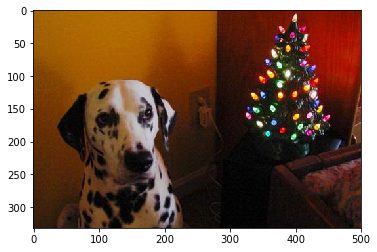

Detecting species and breed...
Image is of species dog and resembles dog breed Dalmatian


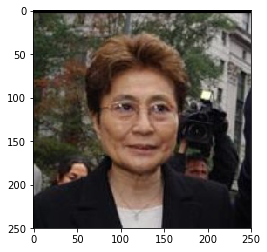

Detecting species and breed...
Image is of species human and resembles dog breed Lowchen


In [138]:
#Testing with dog and human image
predict_and_show(dog_files_short[1])
predict_and_show(human_files_short[1])


---
<a id='step7'></a>
## Step 7: Test Your Algorithm

In this section, you will take your new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test Your Algorithm on Sample Images!

Test your algorithm at least six images on your computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ The algorithm performed about as well as I excepted. I tested the algorithm with two pictures of dog. Both were of the same dog, but in different circumstances and angles. The algorithm detected correctly that they were pictures of dog. It detected them as Bouvier des Flanders and Portuguese Water Dog breeds which was incorrect. Correct breed is Cão da Serra de Aires. It's understandable that the algorithm got the breed wrong, because Cão da Serra de Aires is not among the labeled training breeds. It resembles a lot like Bouvier des Flanders and Portuguese Water Dog. All are black dogs with curly hair. 

I tested the algorithm also with a picture of myself with and without moustache. The algorithm detected me as a dog of breed Labrador Retriever :). Labrador Retriever is a short-haired skinny dog breed. This description also fits myself :) The image of me with moustache was not detected as human. Probably the picture was taken too close.

The algorithm worked correctly when I gave it a picture of a cat and of a human-shape robot. It detected that the picture is neither a dog or a human. 

The algotrithm could be improved by training it with augmented data, which I didn't do. Another way would be to use another type of pretrained CNN. Now it used Xception but there are also other alternatives. A third way would be have more fully connected layers after the pretrained CNN.


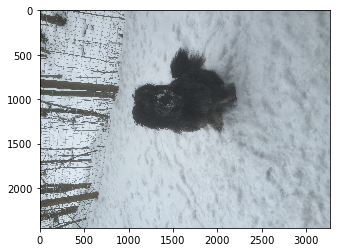

Detecting species and breed...
Image is of species dog and resembles dog breed Portuguese_water_dog


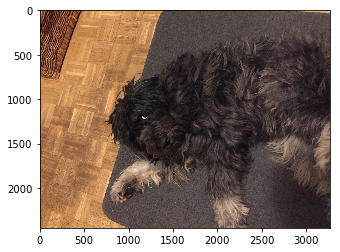

Detecting species and breed...
Image is of species dog and resembles dog breed Bouvier_des_flandres


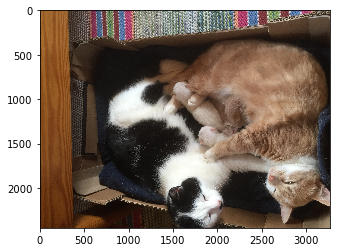

Detecting species and breed...
Image is neither dog or human


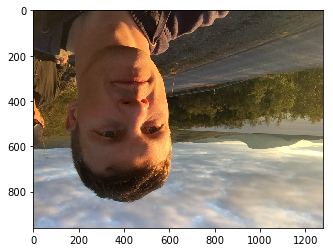

Detecting species and breed...
Image is of species dog and resembles dog breed Labrador_retriever


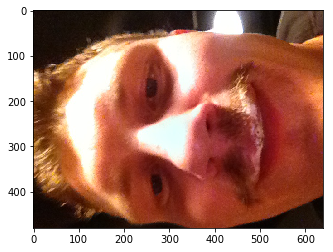

Detecting species and breed...
Image is neither dog or human


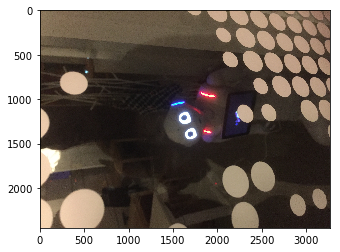

Detecting species and breed...
Image is neither dog or human


In [139]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.
predict_and_show('pic_dog_1.JPG')
predict_and_show('pic_dog_2.JPG')
predict_and_show('pic_cat.JPG')
predict_and_show('pic_human_1.JPG')
predict_and_show('pic_human_2.JPG')
predict_and_show('pic_robot.JPG')

